# August 11 - Semi-supervised learning

## Goal : Compare the fully unsupervised learning vs semi-supervised learning using true labels and energies

In [2]:
# Imports
import math
import os
import sys
import pandas as pd
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from mpl_toolkits.mplot3d import Axes3D

# Add the path to the parent directory to augment search for module
par_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir))
if par_dir not in sys.path:
    sys.path.append(par_dir)
    
# Import the custom plotting module
from plot_utils import plot_utils
import random
import torch
from plot_utils import notebook_utils_2

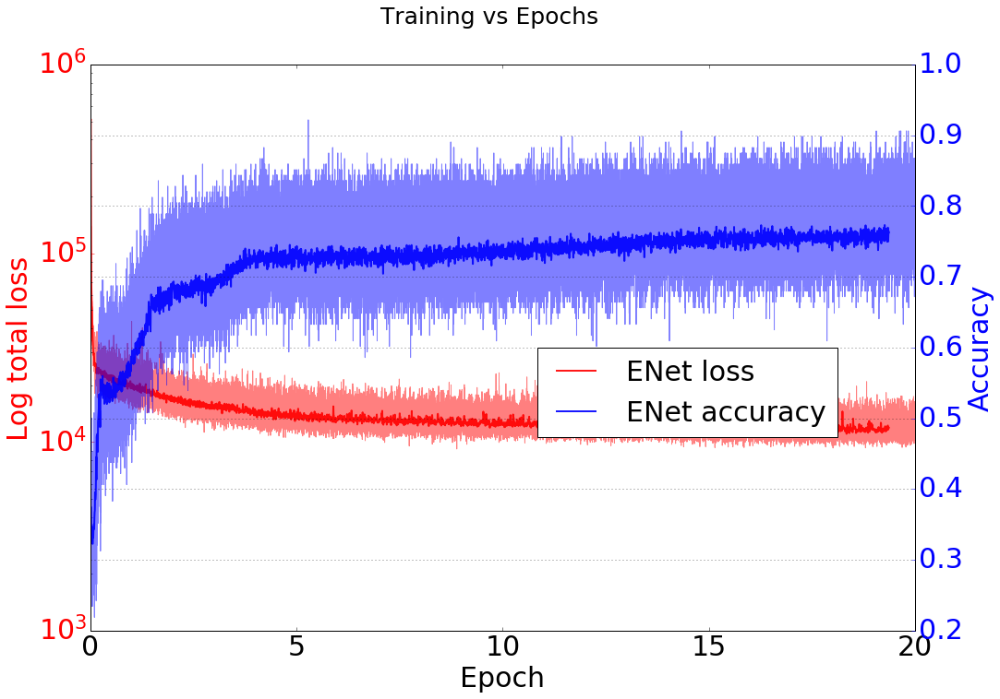

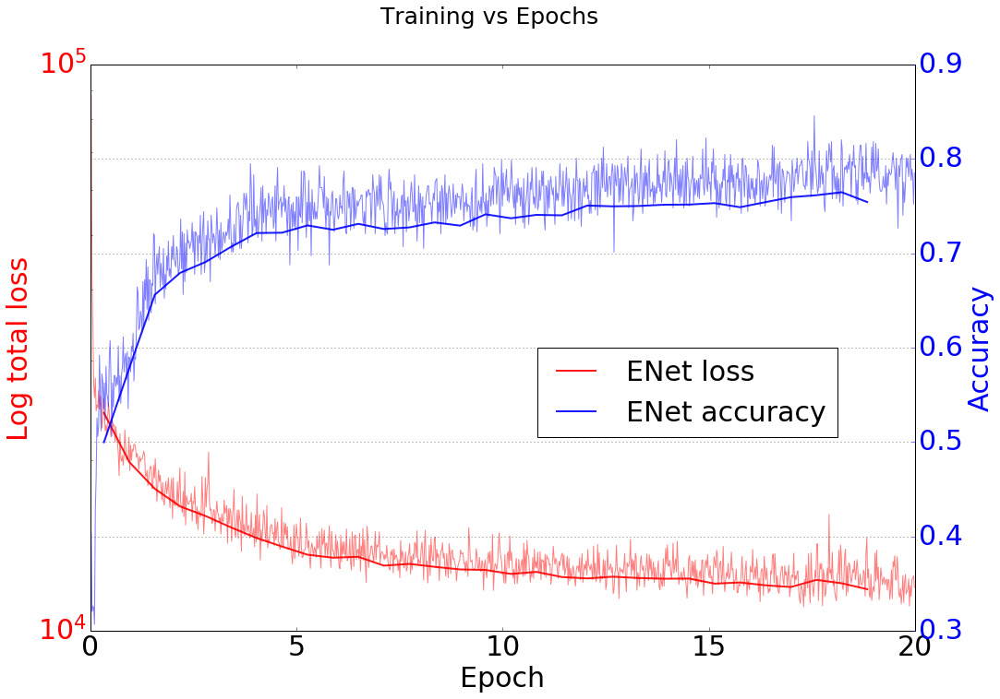

In [3]:
# Using the absolute path
run_id = "20190812_001657"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"
training_log, val_log = dump_dir + "log_train.csv", dump_dir + "log_val.csv"

# Plot training log
plot_utils.plot_training([training_log], ["ENet"], 
                         {"ENet":["red", "blue"]},
                         downsample_interval=32, show_plot=True)

# Plot validation log
plot_utils.plot_training([val_log], ["ENet"], 
                         {"ENet":["red", "blue"]},
                         downsample_interval=32, show_plot=True)

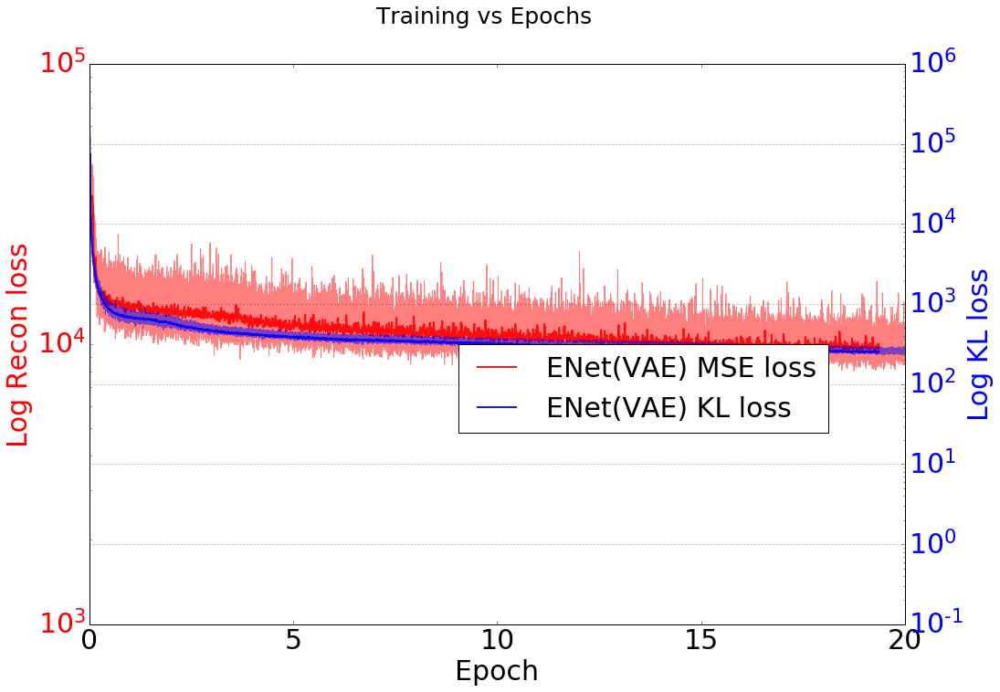

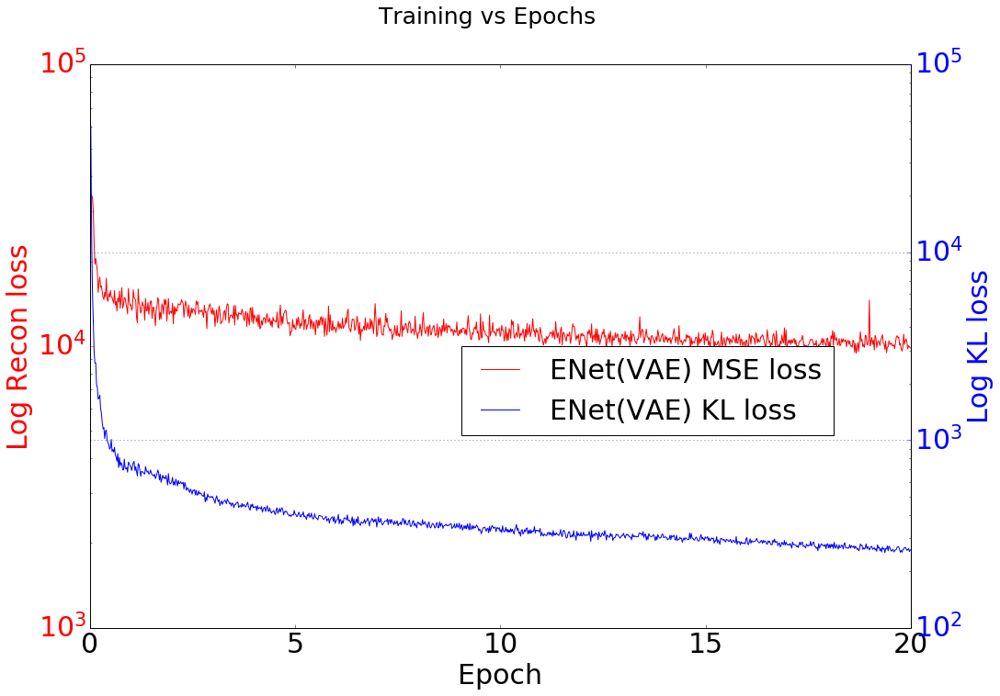

In [4]:
notebook_utils_2.plot_log("20190811_192445", "ENet(VAE)", None, "VAE", "training")
notebook_utils_2.plot_log("20190811_192445", "ENet(VAE)", None, "VAE", "training_validation")

## Print out the average training and validation metrics for comparison with the fully unsupervised or fully supervised models

## Borrowing the method to print the VAE metrics from August 03 - VAE-CL Testing

In [12]:
# Method to print out the comparison values
def print_vae_metrics(run_id):
    
    # Using the absolute path
    dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"
    train_val_log, valid_val_log = dump_dir + "train_validation_log.csv", dump_dir + "valid_validation_log.csv"
    
    # Print the average metrics on the training subset
    log_df = pd.read_csv(train_val_log)
            
    # Extract the loss values from the csv file
    loss_values = log_df["loss"].values
    mse_loss_values  = log_df["recon_loss"].values
    kl_loss_values = log_df["kl_loss"].values
    
    # Print out the average values
    print("Printing metrics over the training subset :")
    print("Average total loss : {0}".format(np.mean(loss_values)))
    print("Average mse loss : {0}".format(np.mean(mse_loss_values)))
    print("Average kl loss : {0}\n\n".format(np.mean(kl_loss_values)))
    
    # Print the average metrics on the training subset
    log_df = pd.read_csv(valid_val_log)
            
    # Extract the loss values from the csv file
    loss_values = log_df["loss"].values
    mse_loss_values  = log_df["recon_loss"].values
    kl_loss_values = log_df["kl_loss"].values
    
    # Print out the average values
    print("Printing metrics over the validation subset :")
    print("Average total loss : {0}".format(np.mean(loss_values)))
    print("Average mse loss : {0}".format(np.mean(mse_loss_values)))
    print("Average kl loss : {0}".format(np.mean(kl_loss_values)))

In [21]:
# Method to print out the comparison values for the classifier and energy regressor
def print_cl_metrics(run_id):
    
    # Using the absolute path
    dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"
    train_val_log, valid_val_log = dump_dir + "train_validation_log.csv", dump_dir + "valid_validation_log.csv"
    
    # Print the average metrics on the training subset
    log_df = pd.read_csv(train_val_log)
    
    # Print out the average values
    print("Printing metrics over the training subset :")
    print("Average ce loss : {0}".format(np.mean(log_df["ce_loss"].values)))
    print("Average mse loss : {0}".format(np.mean(log_df["mse_loss"].values)))
    print("Average accuracy : {0}\n\n".format(np.mean(log_df["accuracy"].values)))
    
    # Print the average metrics on the training subset
    log_df = pd.read_csv(valid_val_log)
            
    # Print out the average values
    print("Printing metrics over the validation subset :")
    print("Average ce loss : {0}".format(np.mean(log_df["ce_loss"].values)))
    print("Average mse loss : {0}".format(np.mean(log_df["mse_loss"].values)))
    print("Average accuracy : {0}\n\n".format(np.mean(log_df["accuracy"].values)))

In [22]:
print_vae_metrics("20190811_192445")

Printing metrics over the training subset :
Average total loss : 11475.425332465067
Average mse loss : 9999.600631075378
Average kl loss : 260.6914165296


Printing metrics over the validation subset :
Average total loss : 12049.374406306819
Average mse loss : 10079.724365232954
Average kl loss : 261.22851811363637


In [23]:
print_cl_metrics("20190812_001657")

Printing metrics over the training subset :
Average ce loss : 0.4094429635555556
Average mse loss : 1541.9307960586666
Average accuracy : 0.7831805532444444


Printing metrics over the validation subset :
Average ce loss : 0.41043526136363634
Average mse loss : 1712.009440693182
Average accuracy : 0.7842871250000001




## How about the regression and classification performance ?

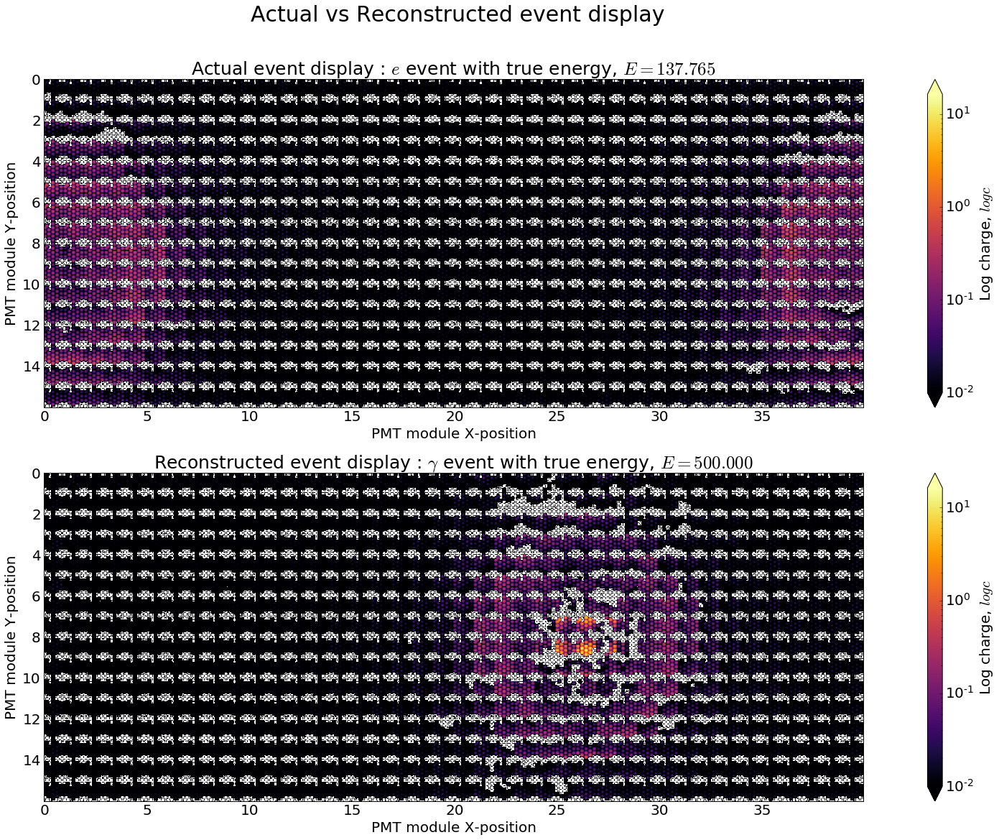

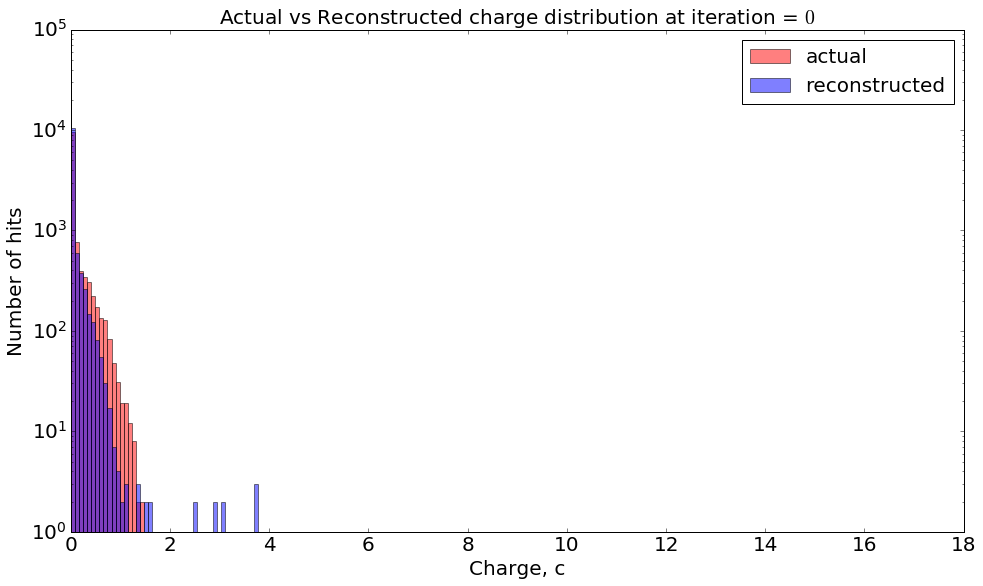

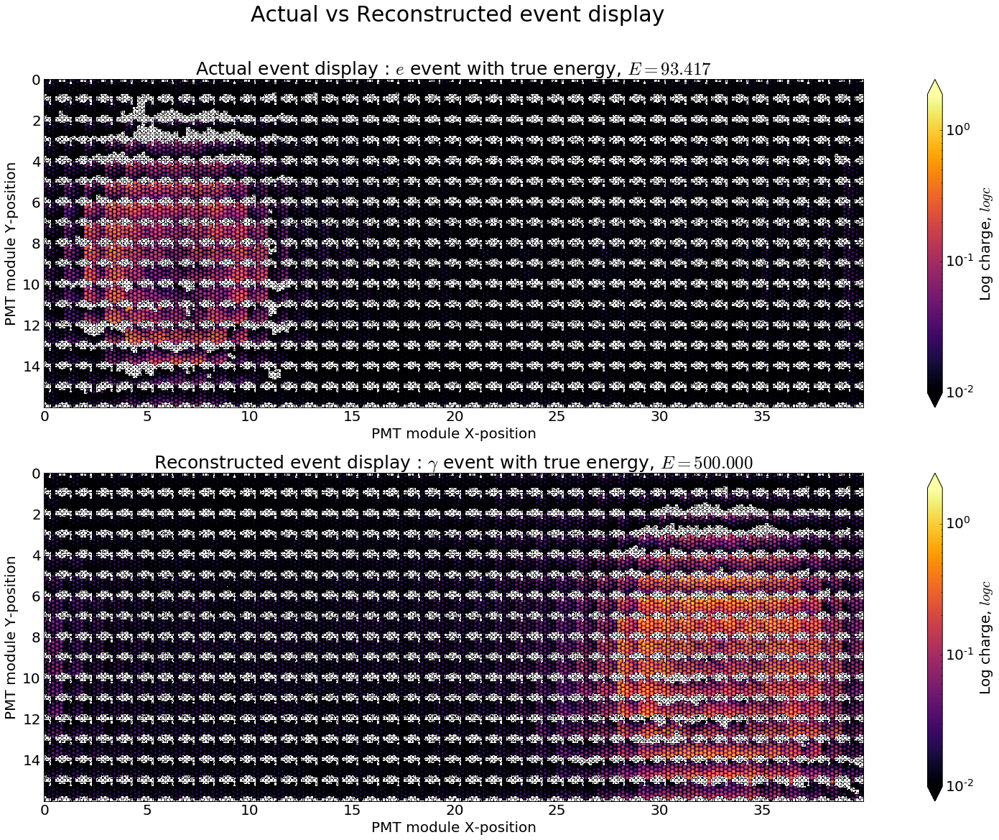

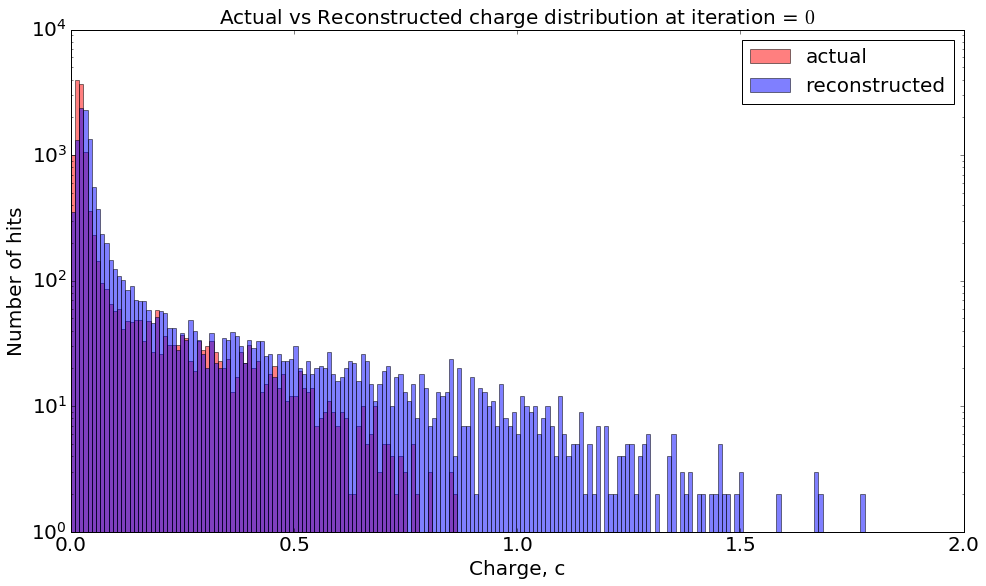

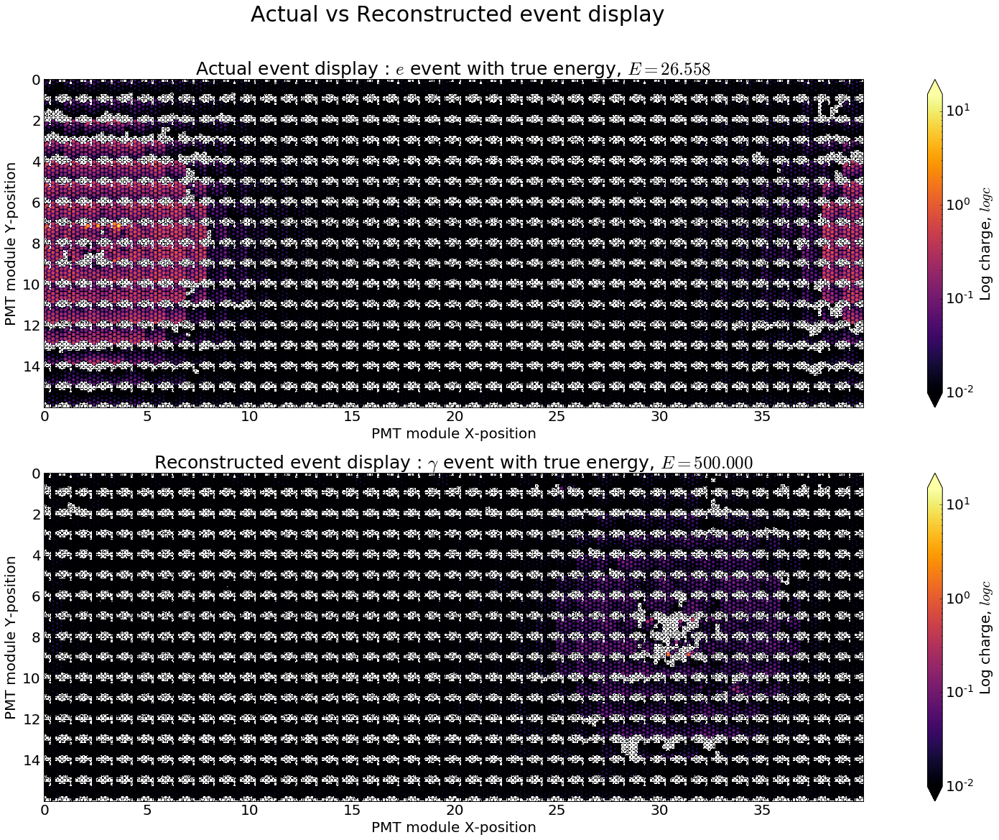

...

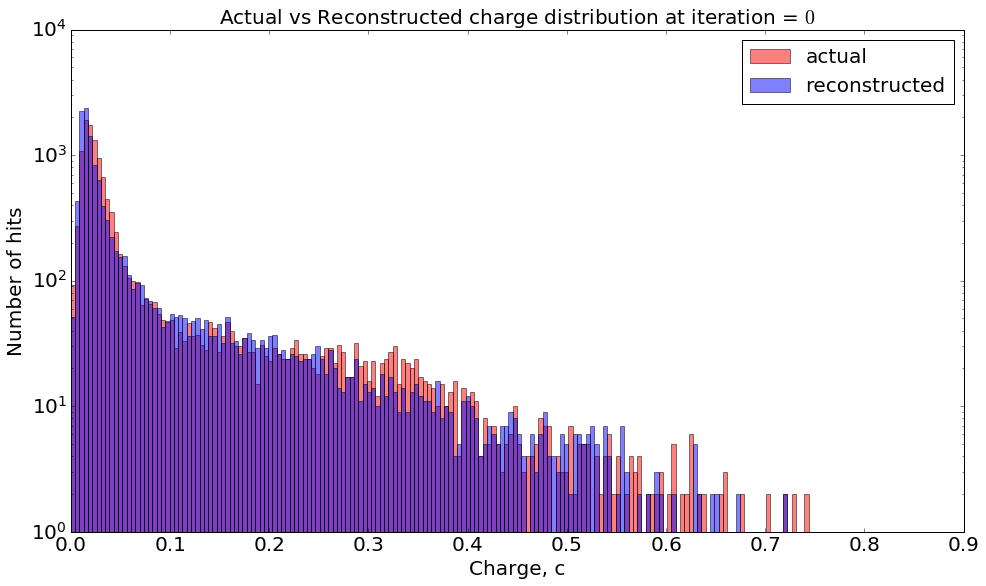

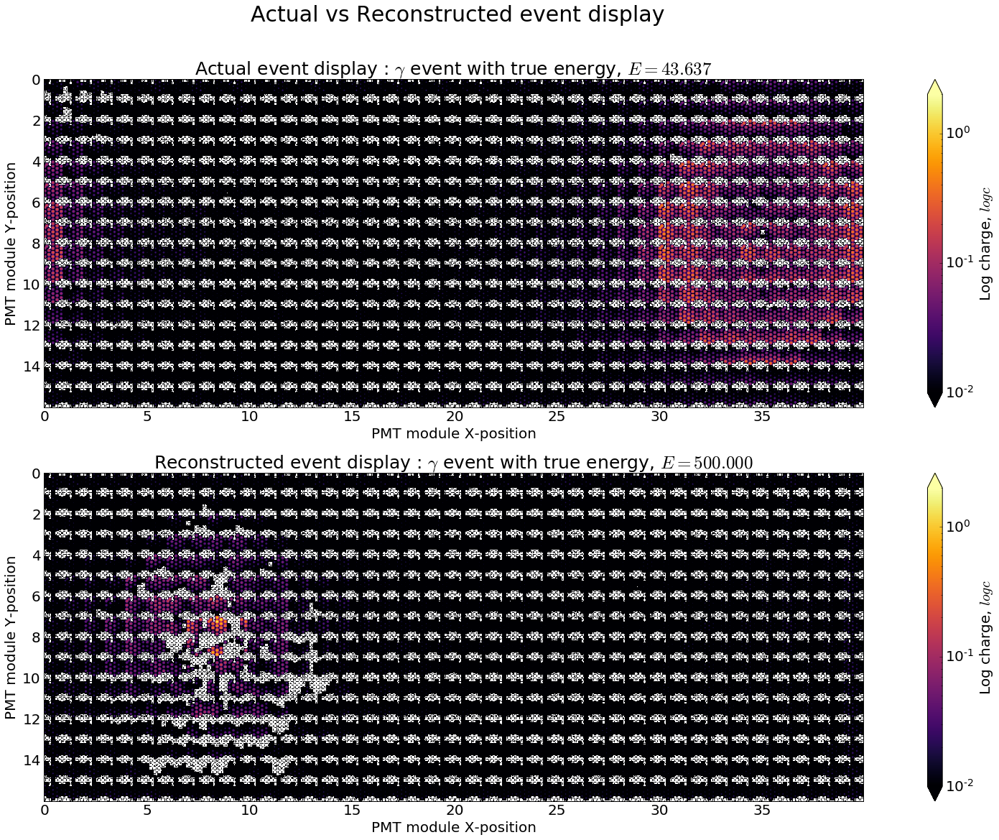

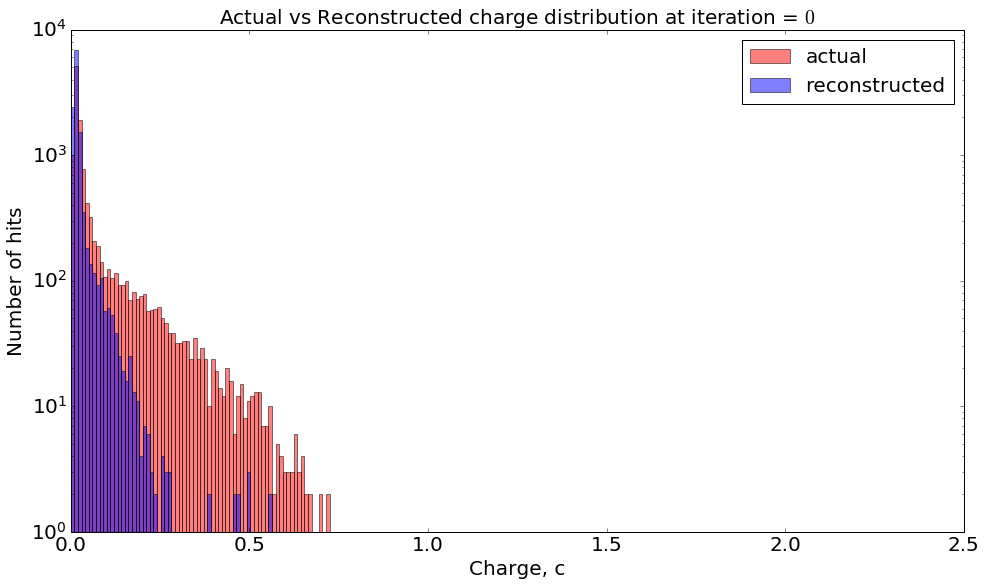

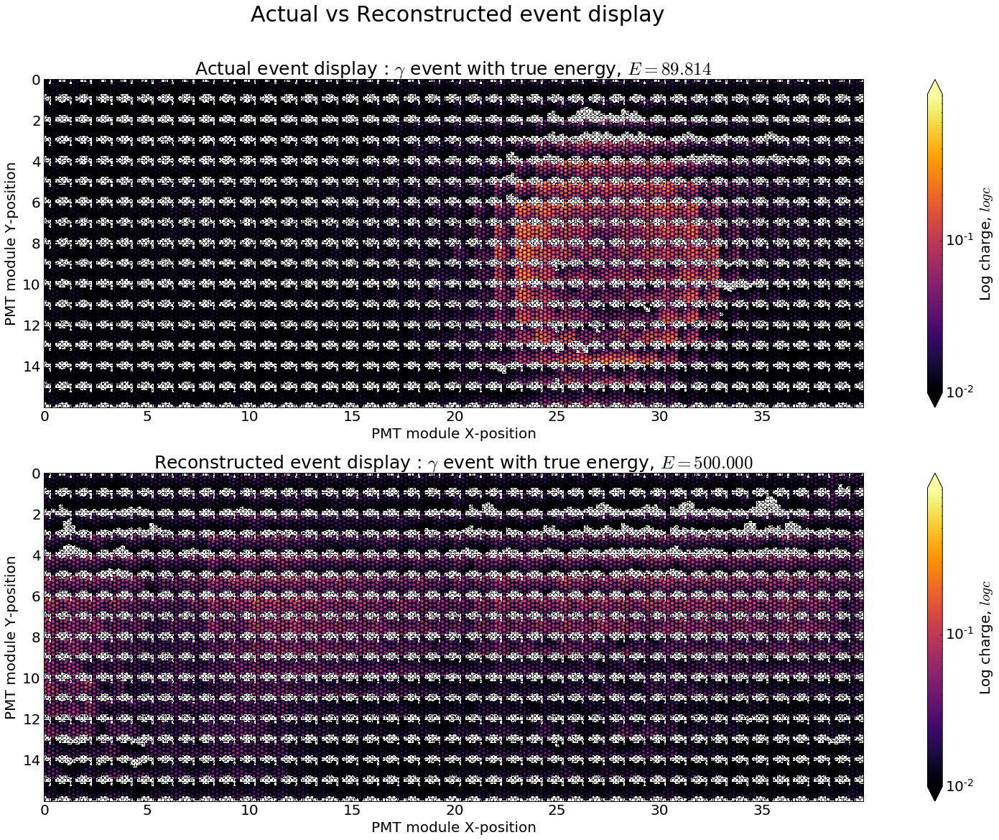

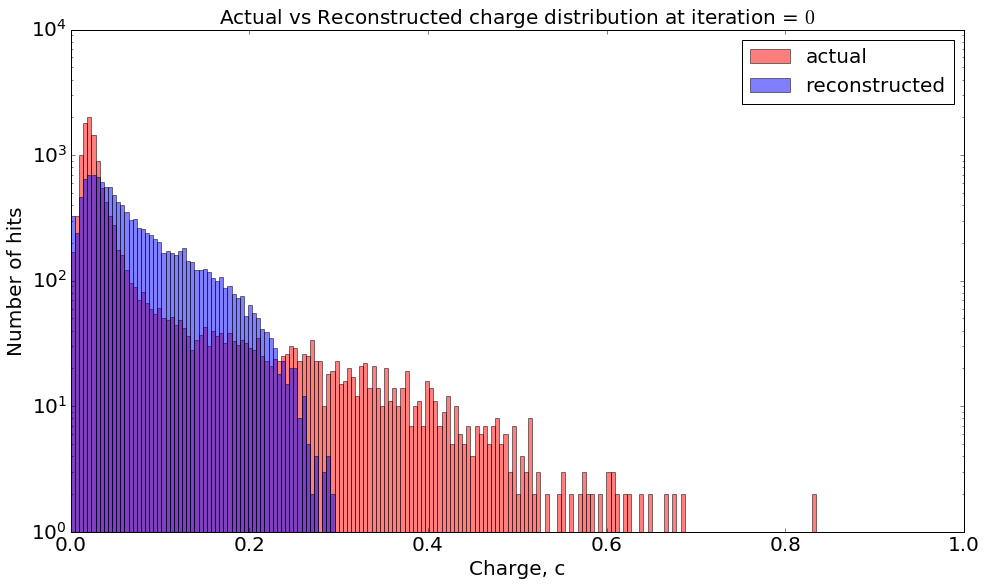

In [26]:
for i in range(10):
    notebook_utils_2.plot_samples("20190811_192445", "ENet", True)

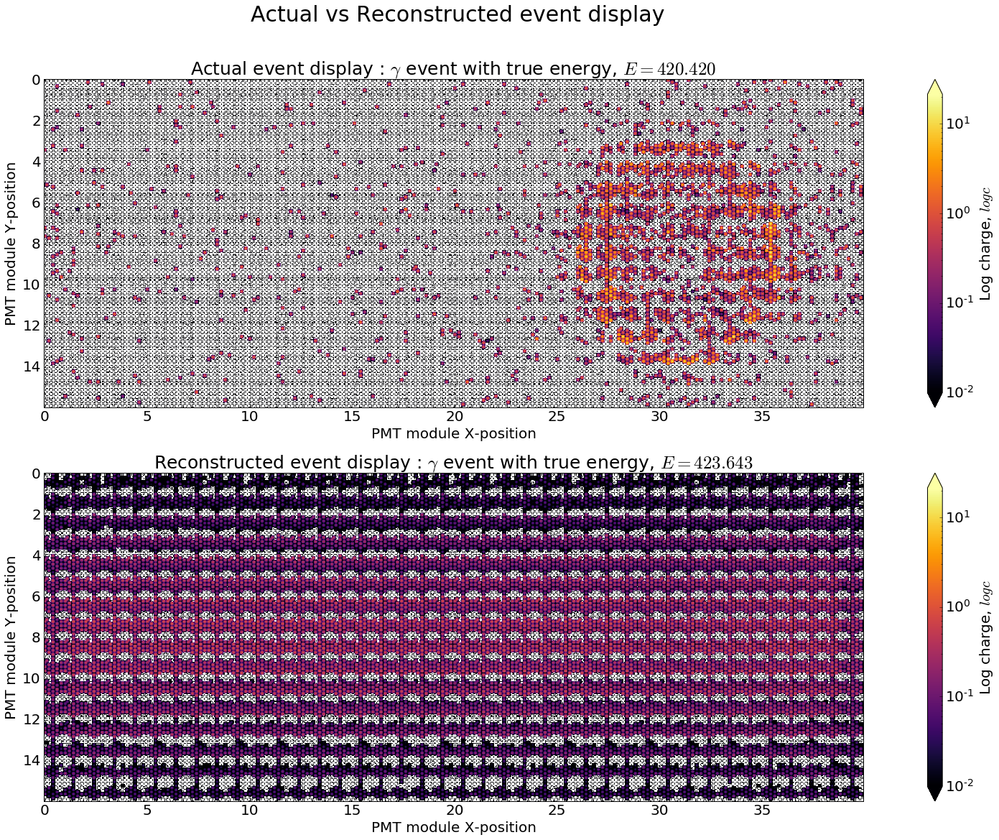

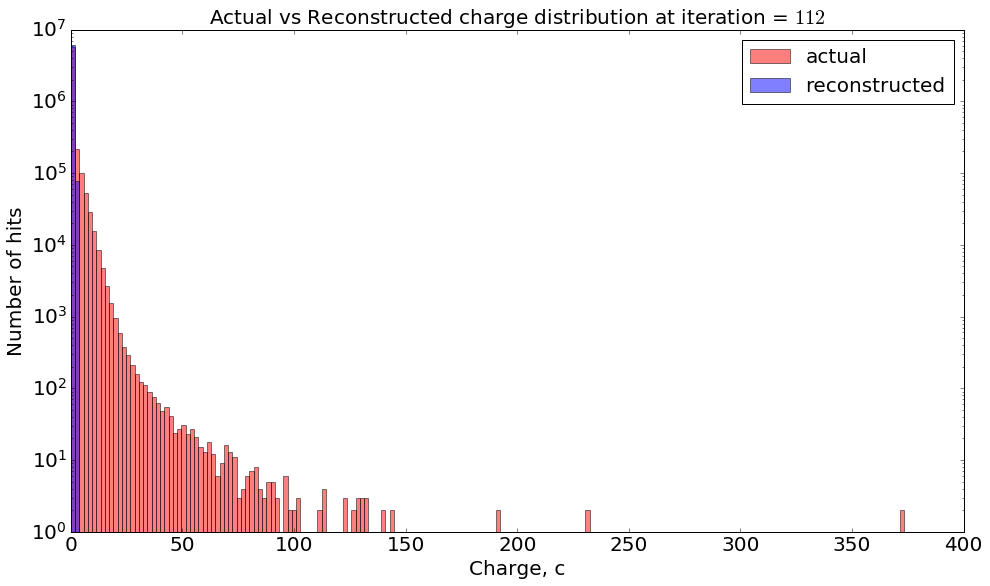

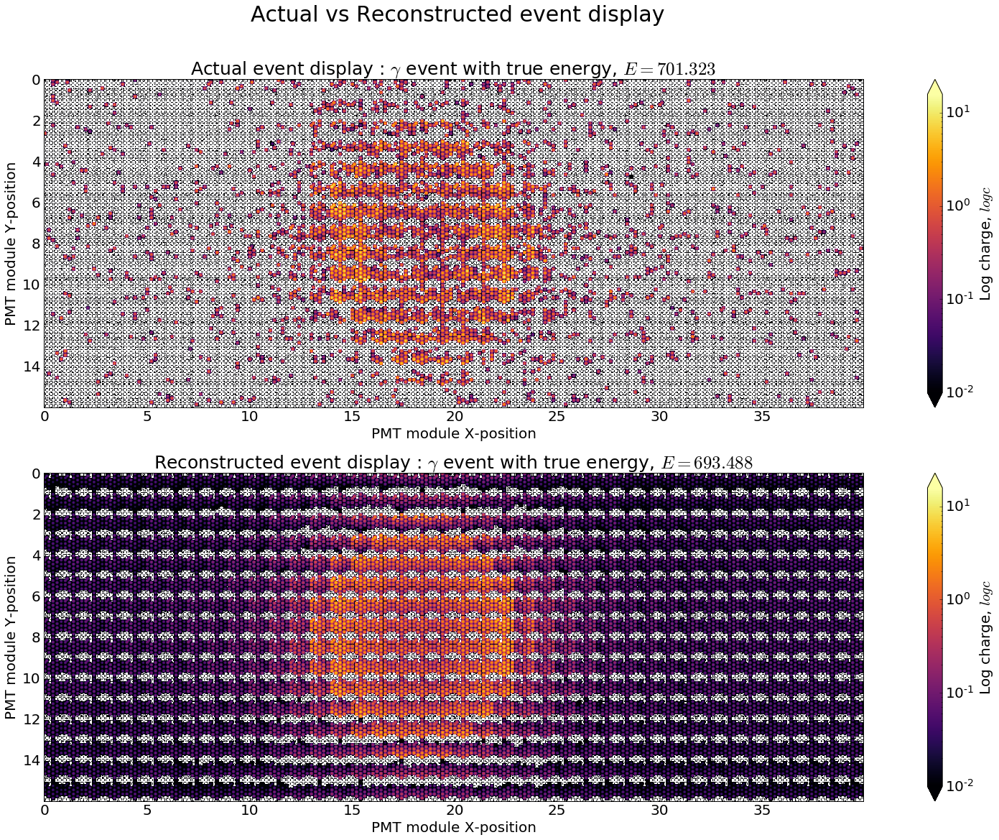

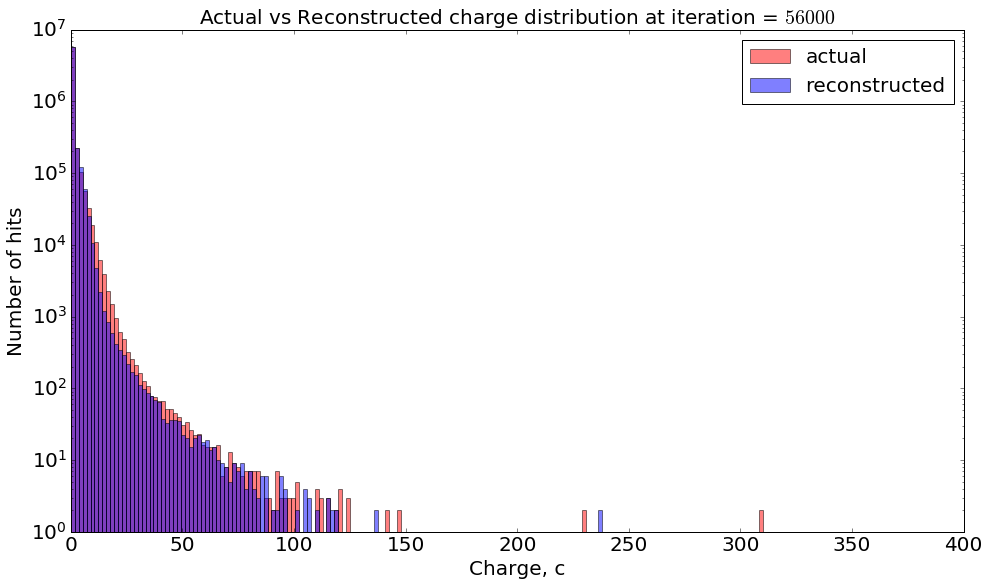

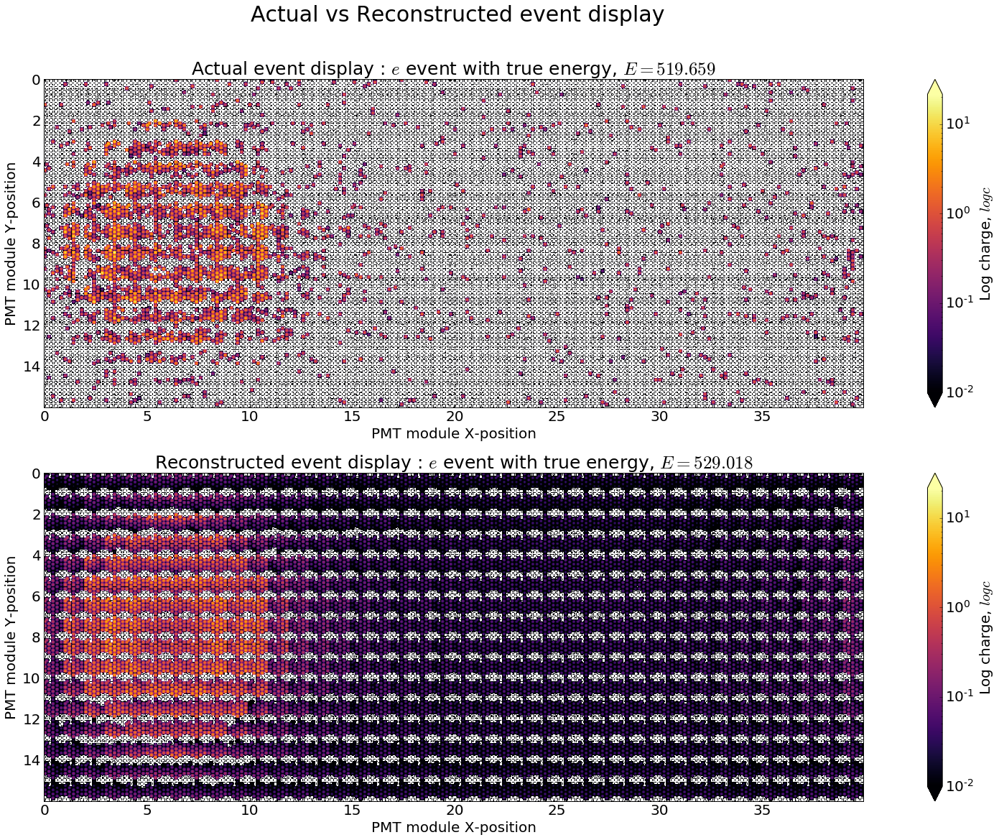

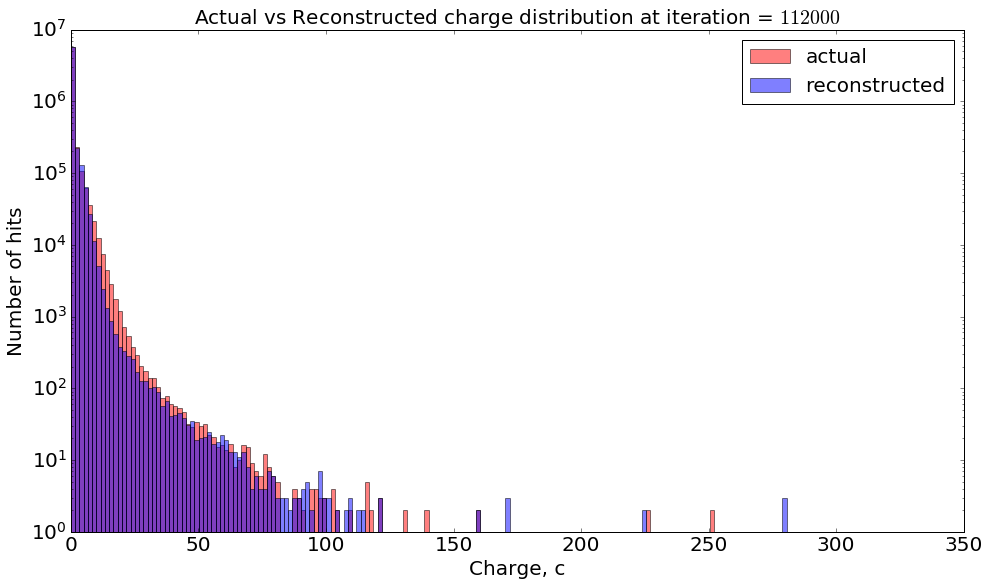

In [3]:
notebook_utils_2.plot_event(run_id, 112, "training")
notebook_utils_2.plot_event(run_id, 56000, "training")
notebook_utils_2.plot_event(run_id, 112000, "training")